In [1]:
import pandas as pd
import numpy as np
import sys
import multiprocessing
import time
import os
import matplotlib.pyplot as plt
import seaborn as sns
from dateutil.parser import parse
from pandas.tseries.offsets import BDay
import pickle as pkl
import fnmatch

from scipy.cluster.hierarchy import dendrogram, linkage
import os
# extra imports
from collections import OrderedDict
from itertools import zip_longest
import datetime as dt
from datetime import timedelta

import glob
import fathon
from fathon import fathonUtils as fu


import matplotlib as mpl
from multiprocessing import Pool, freeze_support, Manager

import itertools
colormap = plt.cm.RdBu
plt.style.use(os.path.join(mpl.get_configdir(),'latexstyle.mplstyle'))
from collections import defaultdict
# import freqopttest.kernel as kernel
import json
colormap = plt.cm.RdBu
plt.style.use(os.path.join(mpl.get_configdir(),'latexstyle.mplstyle'))

In [5]:
base_folder = '/media/ak/Data1/ExperimentData/August11th2022Experiments/ExperimentInputFiles'
figuresLocation = '/home/ak/Documents/Research/Papers/StylisedFactsPaper/figures'
symbol = 'G_1'
symbol_path = os.path.join(base_folder, symbol)
bar = 'tick'
symbol_bar_files = [f for f in os.listdir(symbol_path) if str(bar) in f]
# os.listdir(base_folder)

In [6]:
symbolIdx = 2
symbol_idx_bar_path = os.path.join(symbol_path, symbol_bar_files[symbolIdx])
symbol_idx_bar_path

'/media/ak/Data1/ExperimentData/August11th2022Experiments/ExperimentInputFiles/G_1/G_1_tick_20180809_exp_df.pkl'

In [7]:

def lag_shift_dataframe(data: pd.DataFrame, lag: int, columns_to_keep: list) -> pd.DataFrame:
    """
    Apply a lag shift to a DataFrame, keeping only specified columns, and returning both the original and lagged values.

    Args:
        data (pd.DataFrame): The input dataframe.
        lag (int): The number of periods to shift the data.
        columns_to_keep (list): A list of columns to keep and apply the shift to.

    Returns:
        combined_data (pd.DataFrame): The DataFrame containing the original and lagged values of the specified columns.
    """

    # Keep only the specified columns
    reduced_data = data[columns_to_keep]

    # Shift the remaining columns by the specified lag
    shifted_data = reduced_data.shift(lag)

    # Concatenate the original and shifted data
    combined_data = pd.concat([reduced_data, shifted_data], axis=1)

    # Update column names to indicate original and lagged values
    combined_data.columns = [f"{col}_orig" if i < len(columns_to_keep) else f"{col}_lag_{lag}" for i, col in enumerate(combined_data.columns)]

    return combined_data


In [8]:

import pandas as pd

def lag_shift_multiple(data: pd.DataFrame, max_lag: int, columns_to_keep: list) -> pd.DataFrame:
    """
    Apply multiple lag shifts to a DataFrame, keeping only specified columns, and returning both the original and lagged values.

    Args:
        data (pd.DataFrame): The input dataframe.
        max_lag (int): The maximum number of periods to shift the data.
        columns_to_keep (list): A list of columns to keep and apply the shift to.

    Returns:
        combined_data (pd.DataFrame): The DataFrame containing the original and lagged values of the specified columns for all lags up to max_lag.
    """

    # Keep only the specified columns
    reduced_data = data[columns_to_keep]

    # Create a list to store dataframes with different lag values
    lag_dataframes = [reduced_data]

    # Apply lags from 1 to max_lag and append the lagged dataframes to the list
    for lag in range(1, max_lag + 1):
        shifted_data = reduced_data.shift(lag)
        shifted_data.columns = [f"{col}_lag{lag}" for col in shifted_data.columns]
        lag_dataframes.append(shifted_data)

    combined_data = pd.concat(lag_dataframes, axis=1)
    return combined_data

In [9]:
def create_heatmap(df):
    """
    Takes a Pandas DataFrame as input and creates a heatmap using Seaborn.

    Args:
        df (pd.DataFrame): The input dataframe.

    Returns:
        None.
    """
    # Create the heatmap
    plt.figure(figsize=(10, 8)) # Set the size of the figure
    sns.heatmap(df.corr(), cmap='coolwarm', annot=True, fmt='.2f')

    # Add a title
    plt.title("Correlation Heatmap")

    # Show the plot
    plt.show()

In [10]:
print(symbol_idx_bar_path)

/media/ak/Data1/ExperimentData/August11th2022Experiments/ExperimentInputFiles/G_1/G_1_tick_20180809_exp_df.pkl


In [11]:
df = pd.read_pickle(symbol_idx_bar_path)
df.columns.values

array(['micro_price', 'price_imbalance', 'pct_change_micro_price',
       'weighted_activity_spread', 'GK_vol', 'arrival_rates',
       'returns_normalised', 'returns_mix_max', 'skew', 'kurt',
       'median_traded_volume'], dtype=object)

In [126]:
list_of_columns =['price_imbalance', 'pct_change_micro_price','median_traded_volume','weighted_activity_spread']

In [127]:
lag_shift_dataframe(df, 4, list_of_columns).T

,0,1,2,3,4,5,6,7,8,9,...,4718,4719,4720,4721,4722,4723,4724,4725,4726,4727
price_imbalance_orig,-11.734062,-13.587973,-27.454325,-50.146345,-24.391246,-33.080651,-28.049597,-47.626438,-38.912346,-12.559725,...,-47.548338,-27.796178,1.758248,7.788466,-11.756324,-31.439833,23.914218,7.792731,19.045226,26.849309
pct_change_micro_price_orig,0.000000,0.000050,0.000098,-0.000098,0.000011,0.000041,-0.000030,-0.000182,0.000136,-0.000199,...,-0.000082,0.000016,0.000094,-0.000009,-0.000030,0.000031,0.000015,0.000148,0.000017,-0.000073
median_traded_volume_orig,5.500000,5.500000,2.500000,1.000000,1.000000,1.500000,1.500000,1.500000,3.500000,5.500000,...,1.000000,3.000000,3.500000,1.500000,1.500000,2.000000,1.500000,1.500000,1.500000,3.500000
weighted_activity_spread_orig,0.012093,0.013895,0.011323,0.013081,0.014218,0.009645,0.008966,0.013517,0.012960,0.012090,...,0.011231,0.010000,0.011033,0.010000,0.011547,0.010000,0.010000,0.008435,0.010135,0.008071
price_imbalance_lag_4,NaN,NaN,NaN,NaN,-11.734062,-13.587973,-27.454325,-50.146345,-24.391246,-33.080651,...,-9.370381,-9.778456,3.006098,-6.830833,-47.548338,-27.796178,1.758248,7.788466,-11.756324,-31.439833
pct_change_micro_price_lag_4,NaN,NaN,NaN,NaN,0.000000,0.000050,0.000098,-0.000098,0.000011,0.000041,...,-0.000075,0.000003,0.000012,-0.000030,-0.000082,0.000016,0.000094,-0.000009,-0.000030,0.000031
median_traded_volume_lag_4,NaN,NaN,NaN,NaN,5.500000,5.500000,2.500000,1.000000,1.000000,1.500000,...,4.500000,1.500000,1.000000,1.000000,1.000000,3.000000,3.500000,1.500000,1.500000,2.000000
weighted_activity_spread_lag_4,NaN,NaN,NaN,NaN,0.012093,0.013895,0.011323,0.013081,0.014218,0.009645,...,0.009941,0.009857,0.010000,0.010000,0.011231,0.010000,0.011033,0.010000,0.011547,0.010000


### now moving to multiple 

In [128]:
# A new DataFrame lagged_data is created to store all the lagged columns.
# For each lag step, the data is shifted, and the columns are renamed appropriately.
# These renamed columns are then added to the lagged_data DataFrame.
# Finally, the original data (reduced_data) is combined with all the lagged data.

def lag_shift_multiple_efficient(data: pd.DataFrame, max_lag: int, columns_to_keep: list) -> pd.DataFrame:
    """
    Apply multiple lag shifts to a DataFrame, keeping only specified columns, 
    and returning both the original and lagged values. Each lagged column will 
    be labeled with the column name and respective lag number.

    Args:
        data (pd.DataFrame): The input dataframe.
        max_lag (int): The maximum number of periods to shift the data.
        columns_to_keep (list): A list of columns to keep and apply the shift to.

    Returns:
        combined_data (pd.DataFrame): The DataFrame containing the original 
                                      and lagged values of the specified columns 
                                      for all lags up to max_lag.
    """

    # Keep only the specified columns
    reduced_data = data[columns_to_keep]

    # Initialize an empty DataFrame to hold the lagged data
    lagged_data = pd.DataFrame(index=data.index)

    # Apply lags from 1 to max_lag and add the lagged dataframes to lagged_data
    for lag in range(1, max_lag + 1):
        # Shift the data
        shifted_data = reduced_data.shift(lag)

        # Rename the columns with the appropriate lag
        shifted_data.rename(columns=lambda x: f"{x} lag {lag}", inplace=True)

        # Add the shifted data to the lagged_data DataFrame
        lagged_data = pd.concat([lagged_data, shifted_data], axis=1)

    # Combine the original data with the lagged data
    combined_data = pd.concat([reduced_data, lagged_data], axis=1)

    return combined_data


In [129]:
import time
tic = time.perf_counter()
lag_shift_multiple(df, 2, list_of_columns)
toc = time.perf_counter()
print("elapsed time:", (toc - tic))

elapsed time: 0.0019408010120969266


In [130]:
tic = time.perf_counter()
lag_shift_multiple_efficient(df, 2, list_of_columns)
toc = time.perf_counter()
print("elapsed time:", (toc - tic))

elapsed time: 0.002669353998498991


In [131]:

def main_multiple(idx, symbol_path, symbolIdx, lag, list_of_columns, symbol_bar_files):
    """
    Processes data from a specific file based on a given lag and selected columns.

    Args:
        idx (int): Index to select the specific file or dataset. Currently unused.
        symbol_path (str): The base directory path where the data files are stored.
        symbolIdx (int): Index to select a specific file from the symbol_bar_files list.
        lag (int): The lag period or shift to apply in data processing.
        list_of_columns (list): List of columns to include in the processing.
        symbol_bar_files (list): List of file names to be processed.

    Returns:
        DataFrame: A processed DataFrame after applying the lag shift operation.
    """
    # Construct the file path
    symbol_idx_bar_path = os.path.join(symbol_path, symbol_bar_files[symbolIdx])

    # Print the file being processed
    print(f"Processing file: {symbol_idx_bar_path} (Symbol: {symbol_bar_files[symbolIdx]})")

    # Load data
    df = pd.read_pickle(symbol_idx_bar_path)

    # Assuming the function lag_shift_multiple_efficient is defined elsewhere
    return lag_shift_multiple_efficient(df, lag, list_of_columns)


# Inputs ### 

In [132]:
# Example setup
symbol_path = symbol_path
clock = bar
symbol_bar_files =[f for f in os.listdir(symbol_path) if str(clock) in f]
 #["file1.pkl", "file2.pkl", ...]  # List of your file names
list_of_columns = list_of_columns
#["column1", "column2", ...]  # Columns to process
lag = 10

# Generate a list of processed DataFrames from multiple datasets
list_of_dataframes = [main_multiple(f, symbol_path, 1, lag, list_of_columns, symbol_bar_files) for f in range(0, 20)]


Processing file: /media/ak/Data1/ExperimentData/August11th2022Experiments/ExperimentInputFiles/G_1/G_1_tick_20180808_exp_df.pkl (Symbol: G_1_tick_20180808_exp_df.pkl)
Processing file: /media/ak/Data1/ExperimentData/August11th2022Experiments/ExperimentInputFiles/G_1/G_1_tick_20180808_exp_df.pkl (Symbol: G_1_tick_20180808_exp_df.pkl)
Processing file: /media/ak/Data1/ExperimentData/August11th2022Experiments/ExperimentInputFiles/G_1/G_1_tick_20180808_exp_df.pkl (Symbol: G_1_tick_20180808_exp_df.pkl)
Processing file: /media/ak/Data1/ExperimentData/August11th2022Experiments/ExperimentInputFiles/G_1/G_1_tick_20180808_exp_df.pkl (Symbol: G_1_tick_20180808_exp_df.pkl)
Processing file: /media/ak/Data1/ExperimentData/August11th2022Experiments/ExperimentInputFiles/G_1/G_1_tick_20180808_exp_df.pkl (Symbol: G_1_tick_20180808_exp_df.pkl)
Processing file: /media/ak/Data1/ExperimentData/August11th2022Experiments/ExperimentInputFiles/G_1/G_1_tick_20180808_exp_df.pkl (Symbol: G_1_tick_20180808_exp_df.pkl

## concatenate into a median dataframe 

In [133]:
median_df = pd.concat(list_of_dataframes).groupby(level=0).median()

In [141]:
median_df

,price_imbalance,pct_change_micro_price,median_traded_volume,weighted_activity_spread,price_imbalance lag 1,pct_change_micro_price lag 1,median_traded_volume lag 1,weighted_activity_spread lag 1,price_imbalance lag 2,pct_change_micro_price lag 2,...,median_traded_volume lag 8,weighted_activity_spread lag 8,price_imbalance lag 9,pct_change_micro_price lag 9,median_traded_volume lag 9,weighted_activity_spread lag 9,price_imbalance lag 10,pct_change_micro_price lag 10,median_traded_volume lag 10,weighted_activity_spread lag 10
0,-22.548579,0.000000,3.5,0.014368,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-18.875743,-0.000141,1.0,0.010254,-22.548579,0.000000,3.5,0.014368,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,23.684391,0.000103,3.0,0.011605,-18.875743,-0.000141,1.0,0.010254,-22.548579,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,32.862695,0.000163,3.0,0.009378,23.684391,0.000103,3.0,0.011605,-18.875743,-0.000141,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,31.378126,0.000077,1.0,0.007672,32.862695,0.000163,3.0,0.009378,23.684391,0.000103,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11141,24.276605,0.000006,6.0,0.010000,42.012061,-0.000029,6.0,0.009850,36.020848,0.000026,...,4.5,0.008043,53.119381,0.000067,3.5,0.013548,14.209724,-0.000063,1.0,0.013085
11142,34.816675,0.000013,1.5,0.009756,24.276605,0.000006,6.0,0.010000,42.012061,-0.000029,...,2.5,0.004915,35.284570,0.000063,4.5,0.008043,53.119381,0.000067,3.5,0.013548
11143,40.961898,-0.000080,2.5,0.008403,34.816675,0.000013,1.5,0.009756,24.276605,0.000006,...,1.5,0.010000,31.999726,-0.000140,2.5,0.004915,35.284570,0.000063,4.5,0.008043
11144,0.005077,-0.000054,2.0,0.010153,40.961898,-0.000080,2.5,0.008403,34.816675,0.000013,...,1.0,0.012545,22.012549,-0.000036,1.5,0.010000,31.999726,-0.000140,2.5,0.004915


In [171]:

def generate_pairwise_lag_dataframes(combined_data: pd.DataFrame) -> list:
    """
    Generate a list of dataframes, each containing the original data and one specific lag.

    Args:
        combined_data (pd.DataFrame): The dataframe containing original and lagged data.

    Returns:
        List[pd.DataFrame]: A list of dataframes, each with original data and one lag.
    """

    # List to store each dataframe
    lag_dataframes = []
    original_dataframes = []

    # Extracting original column names (assuming they don't contain ' lag ')
    original_columns = [col for col in combined_data.columns if ' lag ' not in col]

    # Identifying the maximum lag present in the combined data
    max_lag = max(int(col.split(' lag ')[-1]) for col in combined_data.columns if ' lag ' in col)

    # Generating dataframes for each lag
    for lag in range(1, max_lag + 1):
        # Selecting columns for the specific lag
        lag_columns = [col for col in combined_data.columns if f'lag {lag}' in col]

        # Creating a dataframe with original and lag-specific columns
        df = combined_data[original_columns + lag_columns]
        df_original = combined_data[original_columns]

        # Adding the dataframe to the list
        lag_dataframes.append(df)
        original_dataframes.append(df_original)

    return lag_dataframes, df_original

# Example Usage:
# combined_data = ... # your combined dataframe with original and lagged data
# pairwise_lag_dfs = generate_pairwise_lag_dataframes(combined_data)


## generate all the pairwise DataFrames

In [172]:
pairwise_lag_dfs, pairwise_original = generate_pairwise_lag_dataframes(median_df)

In [144]:
df1 =pairwise_lag_dfs[2].dropna()

In [173]:
pairwise_original

,price_imbalance,pct_change_micro_price,median_traded_volume,weighted_activity_spread
0,-22.548579,0.000000,3.5,0.014368
1,-18.875743,-0.000141,1.0,0.010254
2,23.684391,0.000103,3.0,0.011605
3,32.862695,0.000163,3.0,0.009378
4,31.378126,0.000077,1.0,0.007672
...,...,...,...,...
11141,24.276605,0.000006,6.0,0.010000
11142,34.816675,0.000013,1.5,0.009756
11143,40.961898,-0.000080,2.5,0.008403
11144,0.005077,-0.000054,2.0,0.010153


In [146]:
import seaborn as sns
import matplotlib.pyplot as plt

def create_heatmap(df, tick_fontsize=8, annot_fontsize=6):
    """
    Takes a Pandas DataFrame as input and creates an improved readability heatmap using Seaborn.

    Args:
        df (pd.DataFrame): The input dataframe.
        tick_fontsize (int): The font size of the x and y tick labels.
        annot_fontsize (int): The font size of the annotations.

    Returns:
        None.
    """
    # Set the font and color parameters
    plt.rcParams['font.sans-serif'] = 'Verdana'
    plt.rcParams['axes.edgecolor'] = '#333F4B'
    plt.rcParams['axes.linewidth'] = 0.8
    plt.rcParams['xtick.color'] = '#333F4B'
    plt.rcParams['ytick.color'] = '#333F4B'

    # Define the figure size dynamically based on the dataframe size
    figsize = (max(8, len(df.columns)), max(6, len(df.columns)))
    
    # Create the heatmap
    plt.figure(figsize=figsize)  # Adjust the size of the figure based on the number of columns
    ax = sns.heatmap(df.corr(), cmap='coolwarm', annot=True, fmt='.2f', cbar=False,
                     annot_kws={'size': annot_fontsize})  # Adjust annotation font size

    # Set the font size of the x and y tick labels
    ax.tick_params(axis='x', labelsize=tick_fontsize, rotation=90)
    ax.tick_params(axis='y', labelsize=tick_fontsize, rotation=0)

    # Show the plot
    plt.show()

# Example usage:


In [147]:
create_heatmap(median_df, tick_fontsize=25, annot_fontsize=14)

In [149]:
import seaborn as sns
import matplotlib.pyplot as plt

def create_heatmap(df, tick_fontsize, save_plot=False, title=None):
    """
    Takes a Pandas DataFrame as input and creates a tight heatmap using Seaborn.

    Args:
        df (pd.DataFrame): The input dataframe.
        tick_fontsize (int): The font size of the x and y tick labels.
        save_plot (bool): Whether to save the plot as a PNG file (default is False).
        title (str): The title of the heatmap (default is None).

    Returns:
        None.
    """
    # Set the font and color parameters
    plt.rcParams['font.sans-serif'] = 'Verdana'#'Helvetica'
    plt.rcParams['axes.edgecolor']='#333F4B'
    plt.rcParams['axes.linewidth']=0.8
    plt.rcParams['xtick.color']='#333F4B'
    plt.rcParams['ytick.color']='#333F4B'

    # Create the heatmap
    fig, ax = plt.subplots(figsize=(8, 6), dpi=300) # Set the size and DPI of the figure
    sns.heatmap(df.corr()*100, cmap='coolwarm', annot=True, ax=ax, cbar=False)

    # Set the title of the heatmap
    if title:
        ax.set_title(title, fontsize=14)

    # Set the font size of the x and y tick labels
    ax.tick_params(axis='x', labelsize=tick_fontsize)
    ax.tick_params(axis='y', labelsize=tick_fontsize)

    # Save the plot as a high-quality PNG image
    if save_plot:
        plt.tight_layout()
        plt.savefig('heatmap.png', dpi=300)

    # Show the plot
    plt.show()


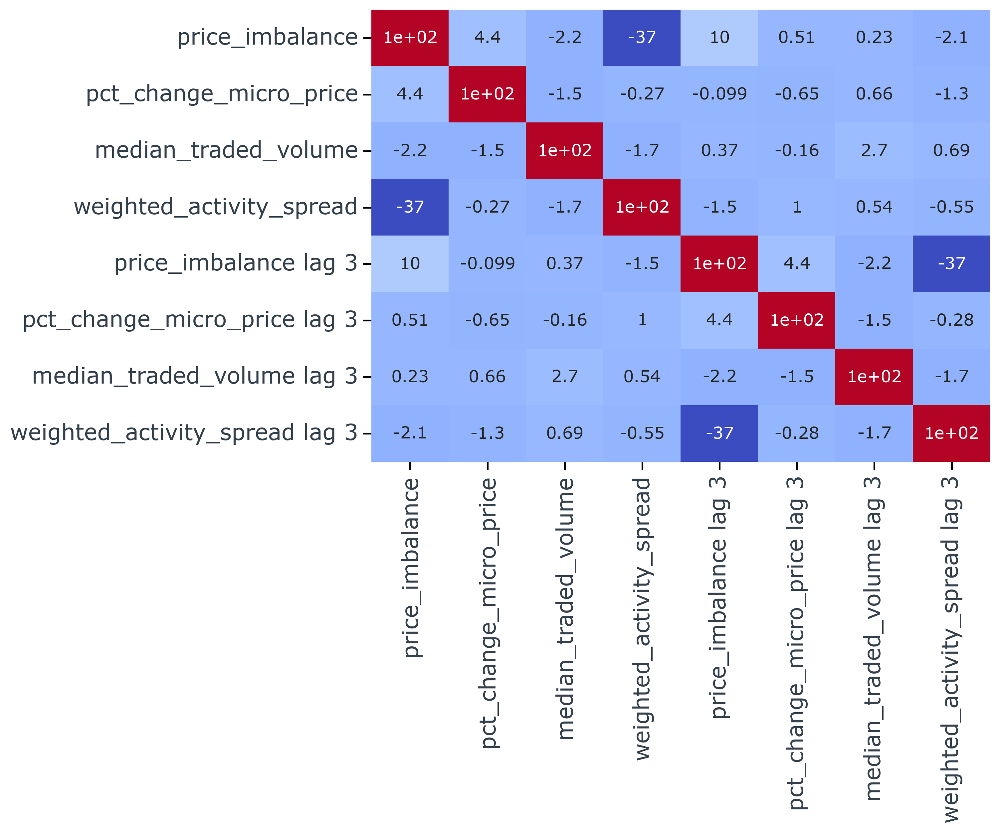

In [150]:
create_heatmap(df1, 16)

In [151]:
import seaborn as sns

def plot_boxplot(df, title,savefig = True):
    """
    Function to plot a horizontal boxplot for each column of the dataframe
    
    Arguments:
    df -- a pandas dataframe
    
    Returns:
    None
    """
    sns.set_theme(style="whitegrid") # Set the Seaborn style to "whitegrid"
    
    for column in df.columns:
        fig, ax = plt.subplots(figsize=(10, 1)) # Create a new figure and axis for each column
        sns.boxplot(x=df[column], orient="h", ax=ax, color='lightblue') # Plot a horizontal boxplot for the column
        ax.set_xlabel(column, fontsize=12) # Set the x-axis label to the column name
        sns.despine(left=True) # Remove the left spine
        plt.show() # Show the plot
        # Optionally save the entire grid of plots to a file
    if savefig:
        filename = title if title else "horizontal_boxplots"
        plt.savefig(f"{filename}.png", bbox_inches='tight')
    else:
        pass


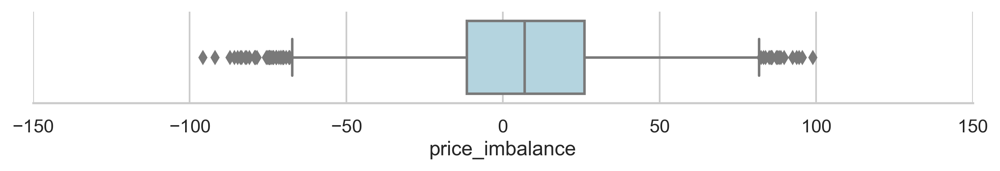

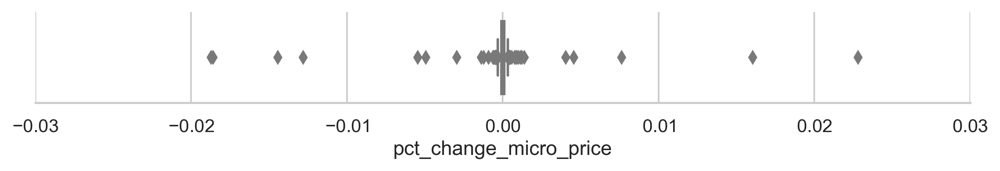

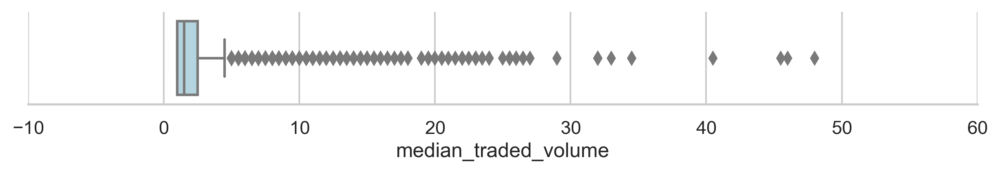

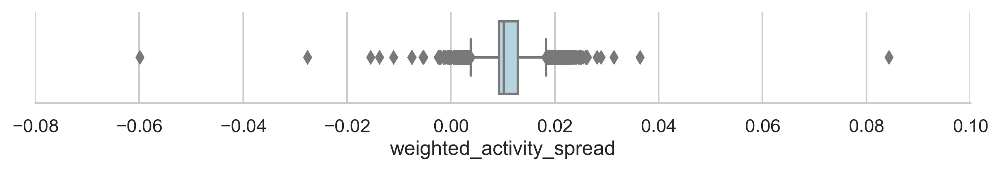

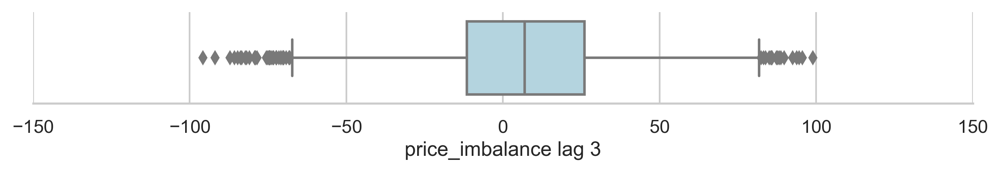

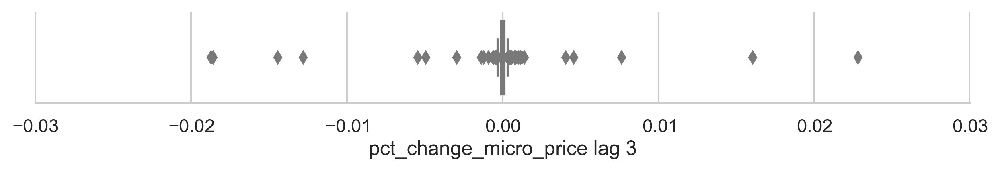

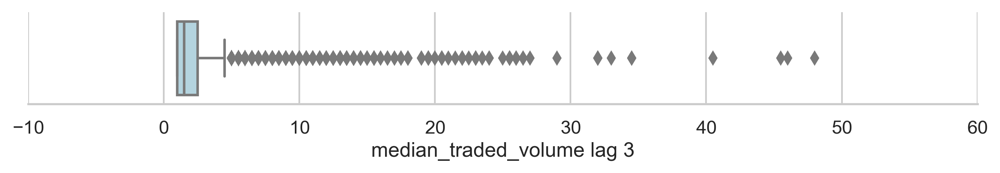

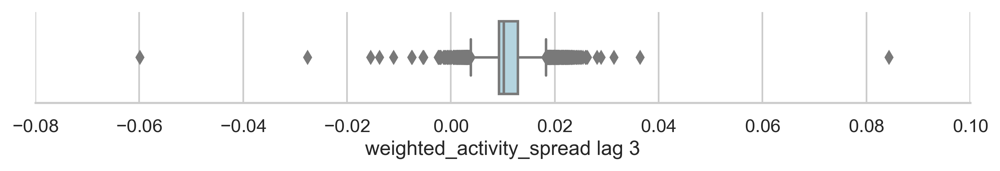

<Figure size 1800x1200 with 0 Axes>

In [152]:
title = '_'.join((str(symbol), str(clock), str('boxplot')))
plot_boxplot(df1, title = os.path.join(figuresLocation,title),savefig = True)

In [153]:
import seaborn as sns

def plot_boxplot_all(df):
    """
    Function to plot a horizontal boxplot for each column of the dataframe
    
    Arguments:
    df -- a pandas dataframe
    
    Returns:
    None
    """
    sns.set_theme(style="whitegrid") # Set the Seaborn style to "whitegrid"
    fig, ax = plt.subplots(figsize=(10, len(df.columns))) # Create a new figure and axis for the plot
    
    sns.boxplot(data=df, orient="h", ax=ax, color='lightblue') # Plot a horizontal boxplot for each column
    ax.set_xlabel("Value", fontsize=12) # Set the x-axis label to "Value"
    ax.set_ylabel("Variable", fontsize=12) # Set the y-axis label to "Variable"
    sns.despine() # Remove the top and right spines
    plt.show() # Show the plot


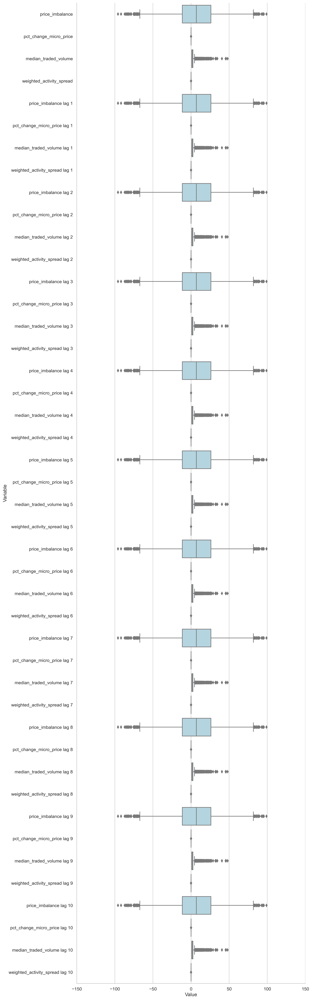

In [154]:
plot_boxplot_all(median_df)

In [155]:
import seaborn as sns
import matplotlib.pyplot as plt


def plot_horizontal_boxplot_all(df, title="", savefig=False):
    """
    Function to plot a horizontal boxplot for each column of the dataframe
    
    Arguments:
    df -- a pandas dataframe
    title -- a string representing the title of the plot (default is an empty string)
    savefig -- a boolean indicating whether to save the plot (default is False)
    
    Returns:
    None
    """
    sns.set_theme(style="ticks") # Set the Seaborn style to "ticks"
    color_palette = sns.color_palette("vlag", n_colors=len(df.columns), desat=.5) # Define a color palette with one color for each column
    
    fig, ax = plt.subplots(figsize=(10, len(df.columns))) # Create a new figure and axis for the plot
    sns.boxplot(data=df, orient="h", palette=color_palette) # Plot all horizontal boxplots in one plot with a different color for each column
    ax.set_ylabel("") # Set the y-axis label to an empty string
    sns.despine() # Remove the top and right spines
    
    if title != "": # If a title is provided
        ax.set_title(title) # Set the title of the plot
    
    if savefig: # If savefig is True
        if title == "": # If no title is provided, set the title to "horizontal_boxplot"
            title = "horizontal_boxplot"
        plt.savefig(title + ".png") # Save the plot as a PNG image
    
    plt.show() # Show the plot



In [156]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_horizontal_boxplot_all(df, title="", savefig=False):
    """
    Function to plot a grid of horizontal boxplots for each column of the dataframe,
    with two plots per row.
    
    Arguments:
    df -- a pandas dataframe
    title -- a string representing the title of the plot (default is an empty string)
    savefig -- a boolean indicating whether to save the plot (default is False)
    
    Returns:
    None
    """
    sns.set_theme(style="ticks")  # Set the Seaborn style to "ticks"
    
    # Calculate the number of rows needed for the subplot grid (2 columns)
    num_cols = 2
    num_rows = int(np.ceil(len(df.columns) / num_cols))
    
    # Create a subplot grid with 2 columns and the necessary number of rows
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5), squeeze=False)
    
    # Loop through the DataFrame's columns and create a boxplot for each
    for i, col in enumerate(df.columns):
        ax = axs[i // num_cols, i % num_cols]  # Determine the correct subplot
        sns.boxplot(x=df[col], ax=ax, color=sns.color_palette("vlag", desat=.5)[i % num_cols])
        ax.set_title(col)  # Set the title for each subplot to the column name
        ax.set_xlabel('')  # Optionally clear the x-axis label
    
    # Hide any empty subplots that aren't used (if the number of columns is odd)
    for j in range(i+1, num_rows * num_cols):
        axs[j // num_cols, j % num_cols].axis('off')
    
    # Adjust the layout to prevent overlapping
    plt.tight_layout()
    
    # Optionally set the main title for the entire grid
    if title:
        fig.suptitle(title, y=1.02)
    
    # Optionally save the entire grid of plots to a file
    if savefig:
        filename = title if title else "horizontal_boxplots"
        plt.savefig(f"{filename}.png", bbox_inches='tight')
    
    # Show the plot
    plt.show()

# Example usage:
# Assuming 'df' is your DataFrame with multiple columns
# plot_horizontal_boxplot_all(df, title="Horizontal Boxplots", savefig=True)


In [157]:
plot_horizontal_boxplot_all(median_df)

In [158]:
def create_heatmap(df, symbol):
    """
    Takes a Pandas DataFrame as input and creates a heatmap using Seaborn.

    Args:
        df (pd.DataFrame): The input dataframe.

    Returns:
        None.
    """
    # Create the heatmap
    plt.figure(figsize=(10, 8)) # Set the size of the figure
    sns.heatmap(df.corr(), cmap='coolwarm', annot=True, fmt='.2f')

    # Add a title
    plt.title(str(symbol))

    # Show the plot
    plt.show()

In [159]:


def create_enhanced_dendrogram(data, symbol, clock_type, figures_location, method='ward', metric='euclidean', title='', figsize=(12, 10), leaf_font_size=16, color_threshold=None, save_plot=False):
    """
    Creates an enhanced dendrogram with a consistent color scheme, clear labeling, and axis titles, then saves it as a PNG file.

    Args:
        data (pd.DataFrame): The input data.
        symbol (str): The symbol to include in the filename.
        clock_type (str): The type of clock to include in the filename.
        figures_location (str): The folder location where the figure will be saved.
        method (str): The clustering method to use.
        metric (str): The distance metric to use.
        title (str): The title of the dendrogram.
        figsize (tuple): The size of the figure.
        leaf_font_size (int): Font size for the leaf labels.
        color_threshold (float): Threshold for color clustering.
        save_plot (bool): Whether to save the plot as a file.

    Returns:
        None.
    """
    # Ensure no missing or infinite values in the data
    data = data.replace([np.inf, -np.inf], np.nan).fillna(data.mean())

    # Compute the linkage matrix
    Z = linkage(data.T, method=method, metric=metric)

    # Determine the color threshold if not provided
    if color_threshold is None:
        color_threshold = 0.7 * np.max(Z[:, 2])

    # Create the dendrogram
    plt.figure(figsize=figsize)
    dendrogram(Z, labels=data.columns, orientation='right', leaf_font_size=leaf_font_size, color_threshold=color_threshold)

    # Add titles and labels
    plt.title(title)
    plt.xlabel('Cluster Dissimilarity')
    plt.ylabel('Time Series Variables')

    # Refine gridlines
    plt.grid(False)

    # Save the plot if requested
    if save_plot:
        # Construct the filename with the symbol and clock type
        filename = f"{symbol}_{clock_type}_dendrogram.png"
        # Construct the full path where the figure will be saved
        full_path = os.path.join(figures_location, filename)
        plt.savefig(full_path, format='png', dpi=300)

    # Show the plot
    plt.show()




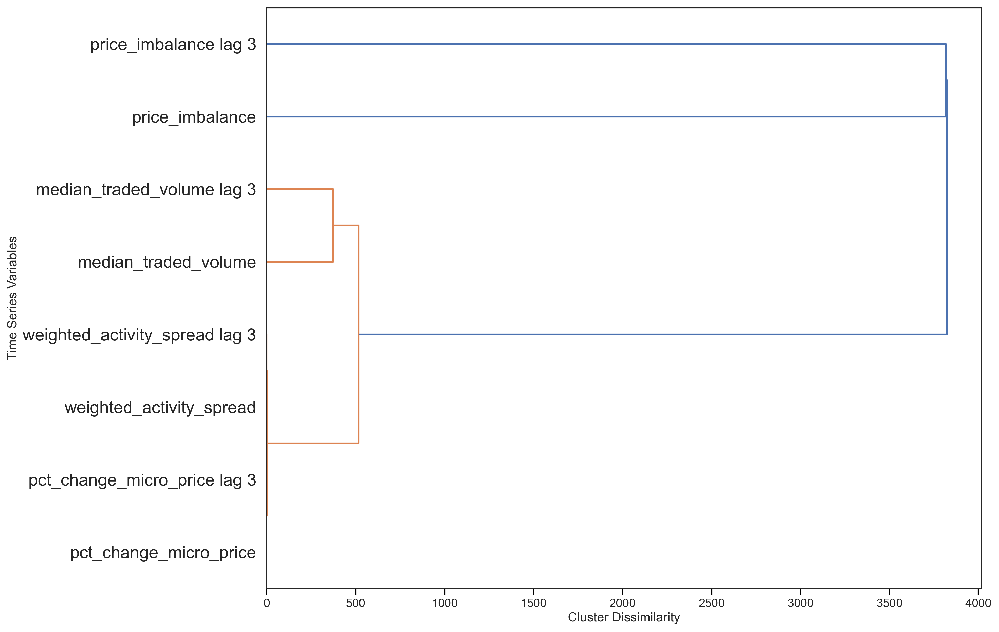

In [160]:
# Example usage:
# Assuming 'df' is your DataFrame with time series data, 'symbol' is the symbol, 'clock_type' is the type of clock
# and 'figures_location' is the path to the folder where the figure should be saved.
create_enhanced_dendrogram(df1, str(symbol), str(clock), symbol_path, save_plot=True)

In [161]:
def create_enhanced_dendrogram(data, ax, method='ward', metric='euclidean', figsize=(10, 8), leaf_font_size=18, color_threshold=None):
    """
    Creates an enhanced dendrogram on a given Axes object.

    Args:
        data (pd.DataFrame): The input data, with each column representing a time series.
        ax (matplotlib.axes.Axes): The Axes object to plot the dendrogram on.
        method (str): The clustering method to use.
        metric (str): The distance metric to use.
        figsize (tuple): The size of the figure.
        leaf_font_size (int): Font size for the leaf labels.
        color_threshold (float): Threshold for color clustering.

    Returns:
        None.
    """
    # Compute the linkage matrix
    Z = linkage(data.T, method=method, metric=metric)

    # Determine the color threshold if not provided
    if color_threshold is None:
        color_threshold = 0.7 * np.max(Z[:, 2])

    # Plot the dendrogram
    dendrogram(Z, labels=data.columns, orientation='right', leaf_font_size=leaf_font_size, color_threshold=color_threshold, ax=ax)
    ax.tick_params(axis='y', labelsize=leaf_font_size)  # Adjust label size

def create_multiple_dendrograms(data, figures_location, symbol, clock_type, num_subsets, method='ward', metric='euclidean', figsize=(40, 40), save_plot=False, leaf_font_size=22):
    """
    Creates multiple dendrograms using subsets of the input data and saves them to specified location.

    Args:
        data (pd.DataFrame): The input data.
        figures_location (str): The folder location where the figure will be saved.
        symbol (str): The symbol to include in the filename.
        clock_type (str): The type of clock to include in the filename.
        num_subsets (int): The number of subsets/dendrograms to create.
        method (str), metric (str), figsize (tuple), save_plot (bool), leaf_font_size (int): As before.

    Returns:
        None.
    """
    # Check for missing or infinite values in the data
    if np.any(np.isnan(data)) or np.any(np.isinf(data)):
        data = data.replace([np.inf, -np.inf], np.nan).fillna(data.mean())

    # Divide the data into subsets
    subset_size = len(data) // num_subsets
    subsets = [data.iloc[i*subset_size:(i+1)*subset_size] for i in range(num_subsets)]

    # Create the figure with subplots
    fig, axes = plt.subplots(nrows=num_subsets, ncols=1, figsize=figsize)

    # Plot each subset as a dendrogram
    for i, subset in enumerate(subsets):
        create_enhanced_dendrogram(subset, axes[i], method=method, metric=metric, leaf_font_size=leaf_font_size)
        axes[i].tick_params(axis='x', labelsize=leaf_font_size*2)  # Adjust x-axis label size
        axes[i].tick_params(axis='y', labelsize=leaf_font_size*2)  # Adjust x-axis label size


        # Remove title and set other aesthetics
        axes[i].set_title('')
        axes[i].grid(False)  # Refined gridlines

        # If saving the plots individually
        if save_plot:
            filename = f"{symbol}_{clock_type}_dendrogram_subset_{i+1}.png"
            full_path = os.path.join(figures_location, filename)
            plt.savefig(full_path, format='png', dpi=300, bbox_inches='tight')

    # Adjust layout
    plt.tight_layout()

    # Optionally save the entire figure
    if save_plot:
        full_filename = f"{symbol}_{clock_type}_all_dendrograms.png"
        full_path = os.path.join(figures_location, full_filename)
        plt.savefig(full_path, format='png', dpi=300, bbox_inches='tight')

    # Show the plot
    plt.show()

# Example usage
# Assuming 'df' is your DataFrame with time series data
# create_multiple_dendrograms(df, '/path/to/figuresLocation', 'AAPL', 'NYSE', num_subsets=4)


In [162]:
df1 =pairwise_lag_dfs[0].dropna()

In [163]:
#create_multiple_dendrograms(df1, '/path/to/figuresLocation', 'AAPL', 'NYSE', num_subsets=4)

In [164]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

def generate_dendrograms_from_lags(combined_data: pd.DataFrame, figures_location, symbol, clock_type, 
                                   x_tick_size=16, y_tick_size=16, method='ward', metric='euclidean', 
                                   figsize=(5, 4), save_plot=False):
    """
    Generate dendrograms for each unique subset of the input dataframe, with each subset containing the original data and one specific lag.

    Args:
        combined_data (pd.DataFrame): The dataframe containing original and lagged data.
        figures_location (str): The directory where the dendrograms will be saved.
        symbol (str): The financial symbol associated with the data.
        clock_type (str): The type of clock (time frame) used for the data.
        x_tick_size (int): Font size for the x-axis tick labels.
        y_tick_size (int): Font size for the y-axis tick labels.
        method (str): The clustering method to use.
        metric (str): The distance metric to use.
        figsize (tuple): The size of the figure for the dendrograms.
        save_plot (bool): If True, save the dendrogram plots as images.

    Returns:
        None.
    """

    # Extracting original column names (assuming they don't contain ' lag ')
    original_columns = [col for col in combined_data.columns if ' lag ' not in col]

    # Identifying the maximum lag present in the combined data
    max_lag = max(int(col.split(' lag ')[-1]) for col in combined_data.columns if ' lag ' in col)

    # Generating dendrograms for each lag
    for lag in range(1, max_lag + 1):
        # Selecting columns for the specific lag
        lag_columns = [col for col in combined_data.columns if f'lag {lag}' in col]
        
        # Creating a dataframe with original and lag-specific columns
        df = combined_data[original_columns + lag_columns]

        # Ensure no missing or infinite values in the data
        df.replace([np.inf, -np.inf], np.nan, inplace=True)
        df.fillna(df.mean(), inplace=True)

        # Check if there are still any non-finite values
        if not np.all(np.isfinite(df)):
            print(f"Non-finite values found in the dataframe for lag {lag}.")
            continue  # Skip this lag or handle the non-finite values as needed

        # Compute the linkage matrix
        linkage_matrix = linkage(df.T, method=method, metric=metric)
        # Plot the dendrogram
        fig, ax = plt.subplots(figsize=figsize)
        dendrogram(linkage_matrix, labels=df.columns, orientation='right', ax=ax)
        
        # Customize tick parameters
        ax.tick_params(axis='x', labelsize=x_tick_size)
        ax.tick_params(axis='y', labelsize=y_tick_size)

        # Remove the title and gridlines for a cleaner look
        ax.set_title('')
        ax.grid(False)

        # Save the plot if requested
        if save_plot:
            # Construct the filename with the symbol, clock type, and lag
            filename = f"{symbol}_{clock_type}_dendrogram_lag_{lag}.png"
            # Construct the full path where the figure will be saved
            full_path = os.path.join(figures_location, filename)
            plt.savefig(full_path, format='png', dpi=300, bbox_inches='tight')

        # Show the plot
        plt.show()

# Example usage
# combined_data = ... # your combined dataframe with original and lagged data
# generate_dendrograms_from_lags(combined_data, '/path/to/figuresLocation', 'AAPL', 'NYSE')


/home/ak/anaconda3/envs/timeSeries/lib/python3.7/site-packages/pandas/core/frame.py:5239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/ak/anaconda3/envs/timeSeries/lib/python3.7/site-packages/pandas/core/generic.py:6383: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


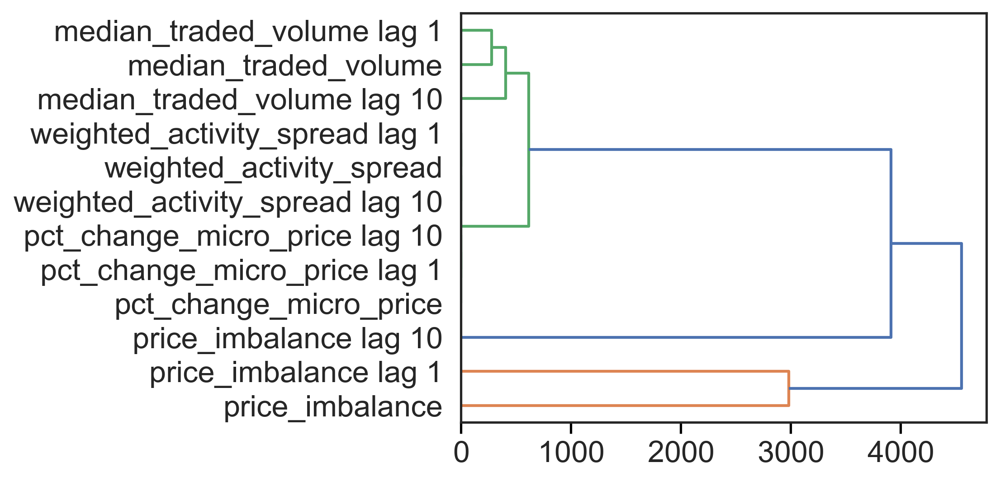

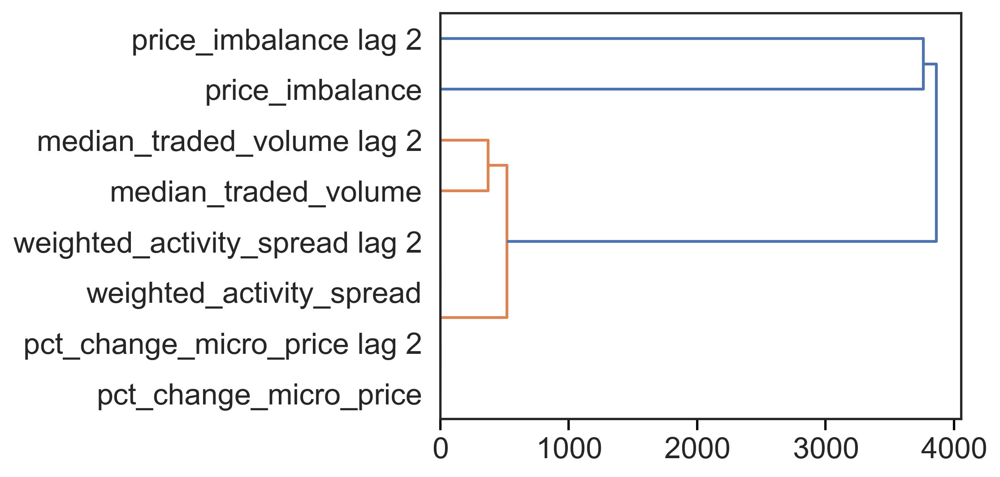

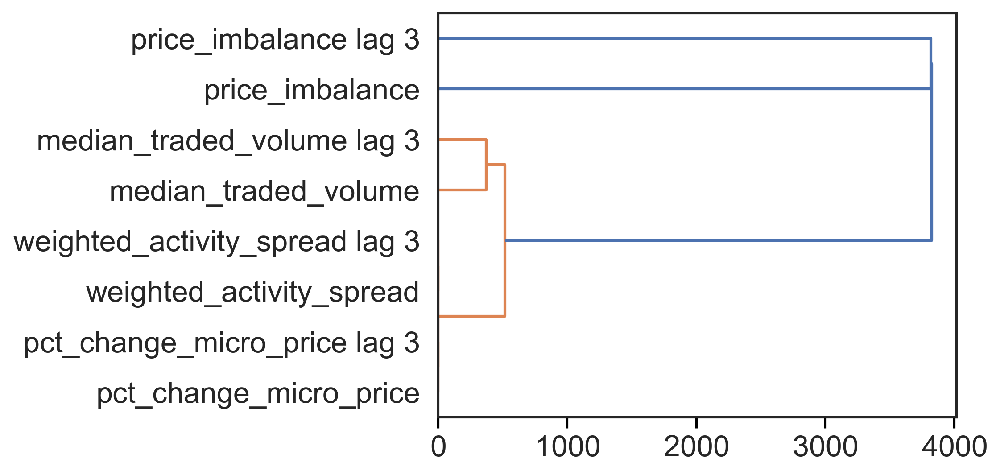

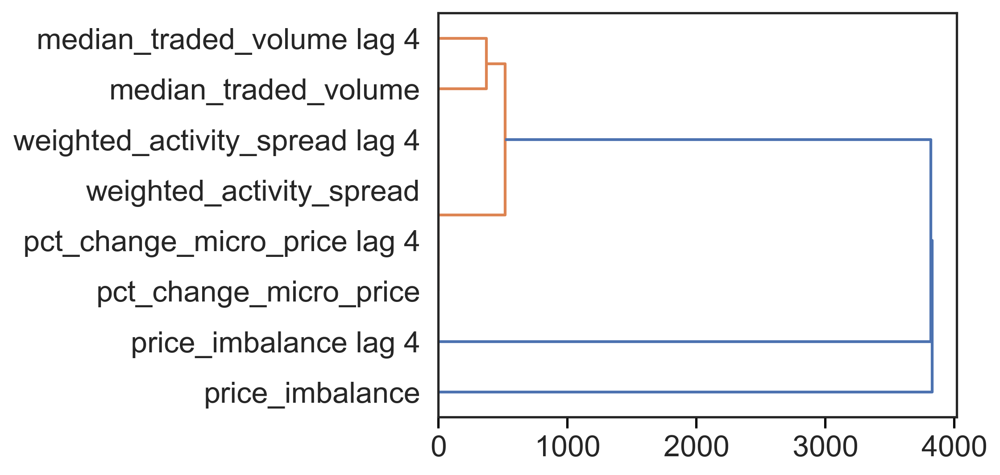

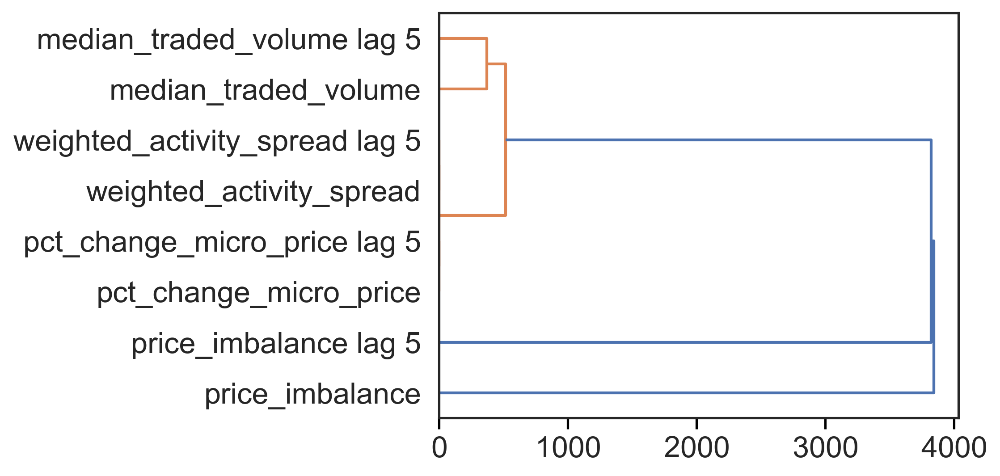

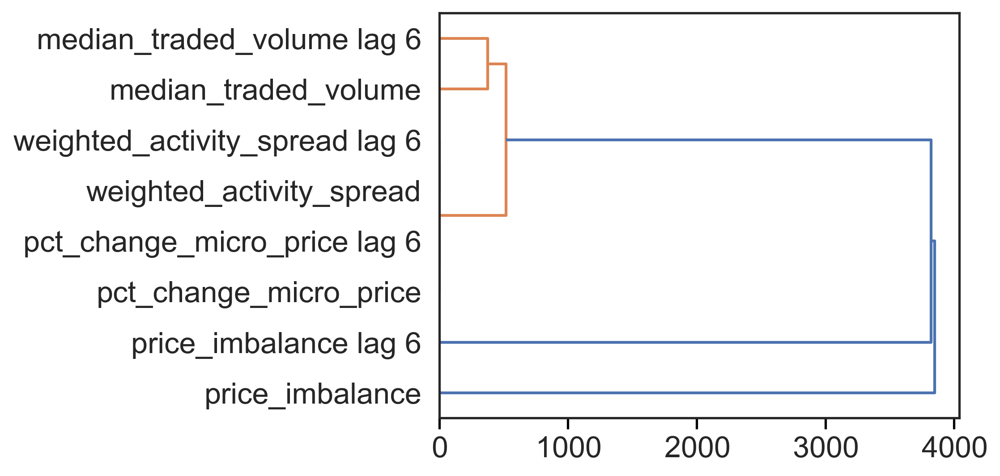

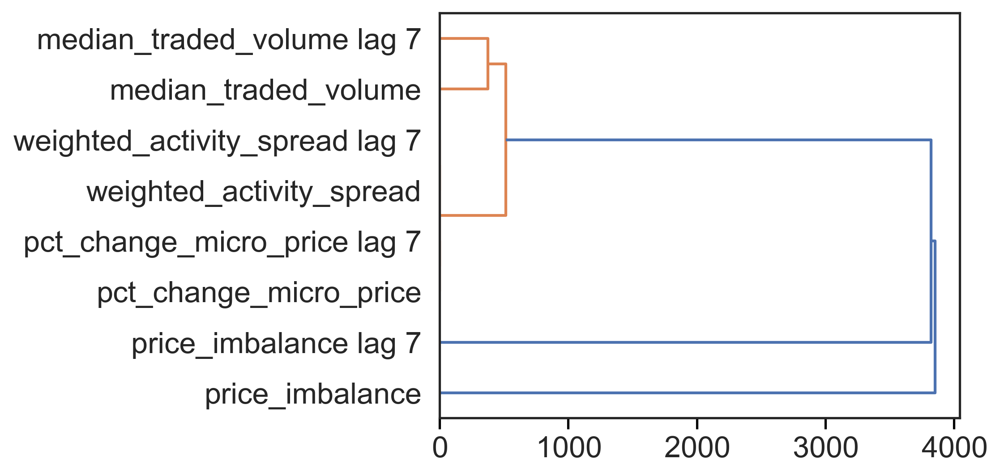

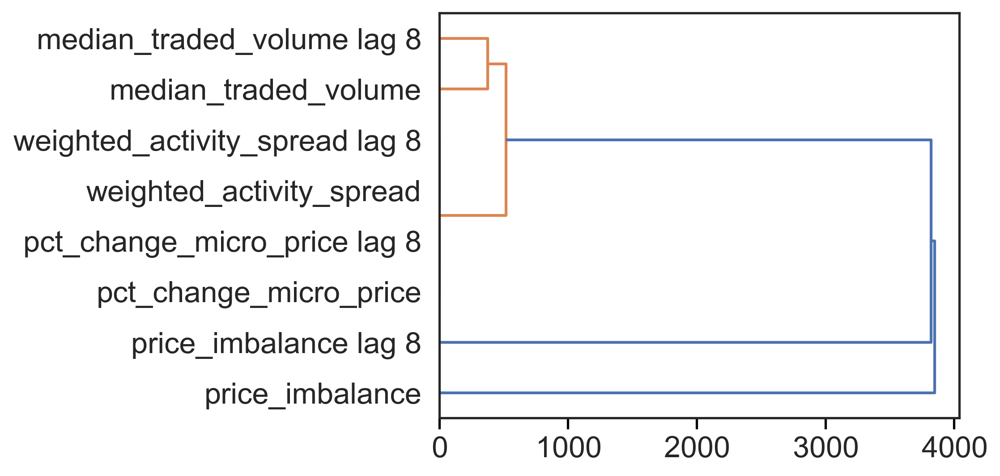

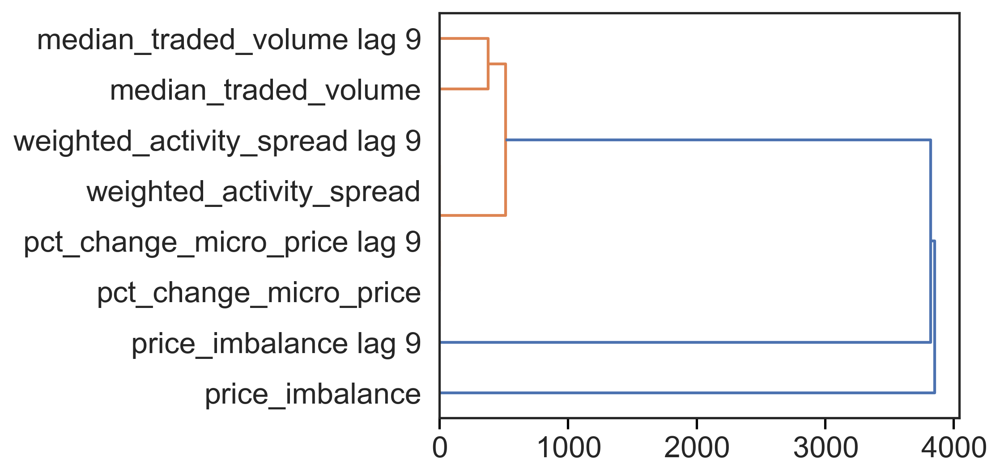

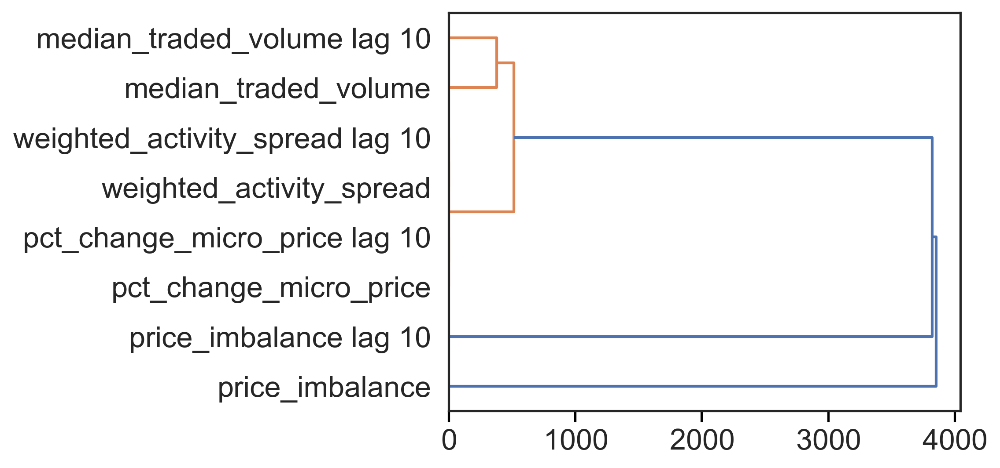

In [165]:
generate_dendrograms_from_lags(median_df, '/path/to/figuresLocation', 'AAPL', 'NYSE')

In [166]:


def generate_dendrograms_from_lags(combined_data, figures_location, symbol, clock_type, x_tick_size=15, y_tick_size=15, method='ward', metric='euclidean', figsize=(24, 12), save_plot=True):
    """
    Generate dendrograms for each unique subset of the input dataframe, with each subset containing the original data and one specific lag.
    The dendrograms are arranged in a grid layout where each row has 2 dendrograms.

    Args:
        combined_data (pd.DataFrame): The dataframe containing original and lagged data.
        figures_location (str): The directory where the dendrograms will be saved.
        symbol (str): The financial symbol associated with the data.
        clock_type (str): The type of clock (time frame) used for the data.
        x_tick_size (int): Font size for the x-axis tick labels.
        y_tick_size (int): Font size for the y-axis tick labels.
        method (str): The clustering method to use.
        metric (str): The distance metric to use.
        figsize (tuple): The size of the figure for each dendrogram.
        save_plot (bool): If True, save the dendrogram plots as images.

    Returns:
        None.
    """

    # Extracting original column names (assuming they don't contain ' lag ')
    original_columns = [col for col in combined_data.columns if ' lag ' not in col]

    # Identifying the maximum lag present in the combined data
    max_lag = max(int(col.split(' lag ')[-1]) for col in combined_data.columns if ' lag ' in col)

    # Calculate the number of rows needed for the subplot grid
    num_rows = (max_lag + 1) // 2

    # Creating the figure with subplots
    fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=figsize)

    # Flattening the axes array for easy iteration
    axes = axes.flatten()

    # Generating dendrograms for each lag
    for lag in range(1, max_lag + 1):
        # Selecting columns for the specific lag
        lag_columns = [col for col in combined_data.columns if f'lag {lag}' in col]
        
        # Creating a dataframe with original and lag-specific columns
        df = combined_data[original_columns + lag_columns]

        # Ensure no missing or infinite values in the data
        df.replace([np.inf, -np.inf], np.nan, inplace=True)
        df.fillna(df.mean(), inplace=True)

        # Check if there are still any non-finite values
        if not np.all(np.isfinite(df)):
            print(f"Non-finite values found in the dataframe for lag {lag}.")
            continue  # Skip this lag or handle the non-finite values as needed

        # Compute the linkage matrix
        linkage_matrix = linkage(df.T, method=method, metric=metric)

        # Plot the dendrogram
        dendrogram(linkage_matrix, labels=df.columns, orientation='right', ax=axes[lag-1])
        plt.subplots_adjust(wspace= 0.85)  # Adjust the width of space between subplots
#         plt.subplots_adjust(hspace= 0.55)  # Adjust the width of space between subplots
        
        # Customize tick parameters
        axes[lag-1].tick_params(axis='x', labelsize=x_tick_size)
        axes[lag-1].tick_params(axis='y', labelsize=y_tick_size)

        # Remove the title and gridlines for a cleaner look
        axes[lag-1].set_title('')
        axes[lag-1].grid(False)

        # Save the plot if requested
        if save_plot:
            # Construct the filename with the symbol, clock type, and lag
            filename = f"{symbol}_{clock_type}_dendrogram_lag_{lag}.png"
            # Construct the full path where the figure will be saved
            full_path = os.path.join(figures_location, filename)
            plt.savefig(full_path, format='png', dpi=300, bbox_inches='tight')

    # Adjust layout
    plt.tight_layout()

    # Show the plot
    plt.show()

# Example usage
# combined_data = ... # your combined dataframe with original and lagged data
# generate_dendrograms_from_lags(combined_data, '/path/to/figuresLocation', 'AAPL', 'NYSE')


In [167]:
clock

'tick'

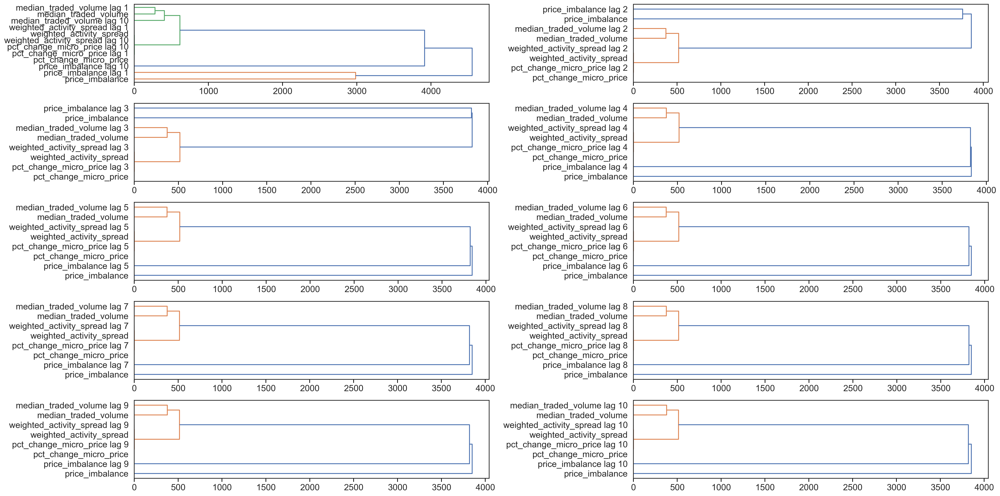

In [168]:
_=generate_dendrograms_from_lags(median_df, figuresLocation, symbol, clock)

In [169]:
def create_lagged_heatmaps(df, max_lag, tick_fontsize, save_fig=False, fig_path='lagged_heatmaps.png'):
    """
    Creates a grid of heatmaps for the correlation matrix of the original data and each specific lag.
    The heatmaps are arranged in two columns.

    Args:
        df (pd.DataFrame): The input dataframe containing the original and lagged data.
        max_lag (int): The maximum lag to include in the heatmaps.
        tick_fontsize (int): The font size of the x and y tick labels.
        save_fig (bool): Whether to save the generated figure.
        fig_path (str): The file path to save the figure if save_fig is True.

    Returns:
        None.
    """
    sns.set_theme(style="ticks")  # Set the Seaborn theme to "ticks"

    # Calculate the number of rows needed for the subplot grid (2 columns)
    num_cols = 2
    num_rows = int(np.ceil((max_lag + 1) / num_cols))

    # Create a subplot grid with the required number of rows and columns
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 10, num_rows * 8), squeeze=False)

    # Flatten the array of axes for easier indexing
    axs = axs.flatten()

    # Extract the original columns (non-lagged)
    original_columns = [col for col in df.columns if 'lag' not in col]

    # Plot a heatmap for each lag
    for lag in range(0, max_lag + 1):
        # Compute the correlation matrix between the original and the lagged variables
        # We need to make sure to only include numeric columns, as correlation is a numeric calculation
        subset_columns = original_columns + [col for col in df.columns if f'lag{lag}' in col]
        subset_df = df[subset_columns].select_dtypes(include=[np.number])

        if subset_df.empty:
            continue  # If the subset is empty, skip to the next iteration

        corr = subset_df.corr()

        # Select the correct subplot
        ax = axs[lag]

        # Create the heatmap
        sns.heatmap(corr, ax=ax, cmap='coolwarm', annot=True, fmt='.2f', cbar=False)
        
        # Customize the ticks
        ax.tick_params(axis='x', labelsize=tick_fontsize, rotation=90)
        ax.tick_params(axis='y', labelsize=tick_fontsize, rotation=0)

        # Set the title for each subplot
        ax.set_title(f'Heatmap for Original & Lag {lag}' if lag > 0 else 'Heatmap for Original')

    # Hide any empty subplots
    for i in range(lag + 1, num_rows * num_cols):
        axs[i].set_visible(False)

    # Adjust the layout to ensure no overlap
    plt.tight_layout()

    # Optionally save the figure
    if save_fig:
        plt.savefig(fig_path, dpi=300, bbox_inches='tight')

    # Show the plot
    plt.show()

# Example usage:
# Assuming 'df' is your DataFrame with original and lagged data
# create_lagged_heatmaps(df, max_lag=4, tick_fontsize=10, save_fig=True, fig_path='my_lagged_heatmaps.png')


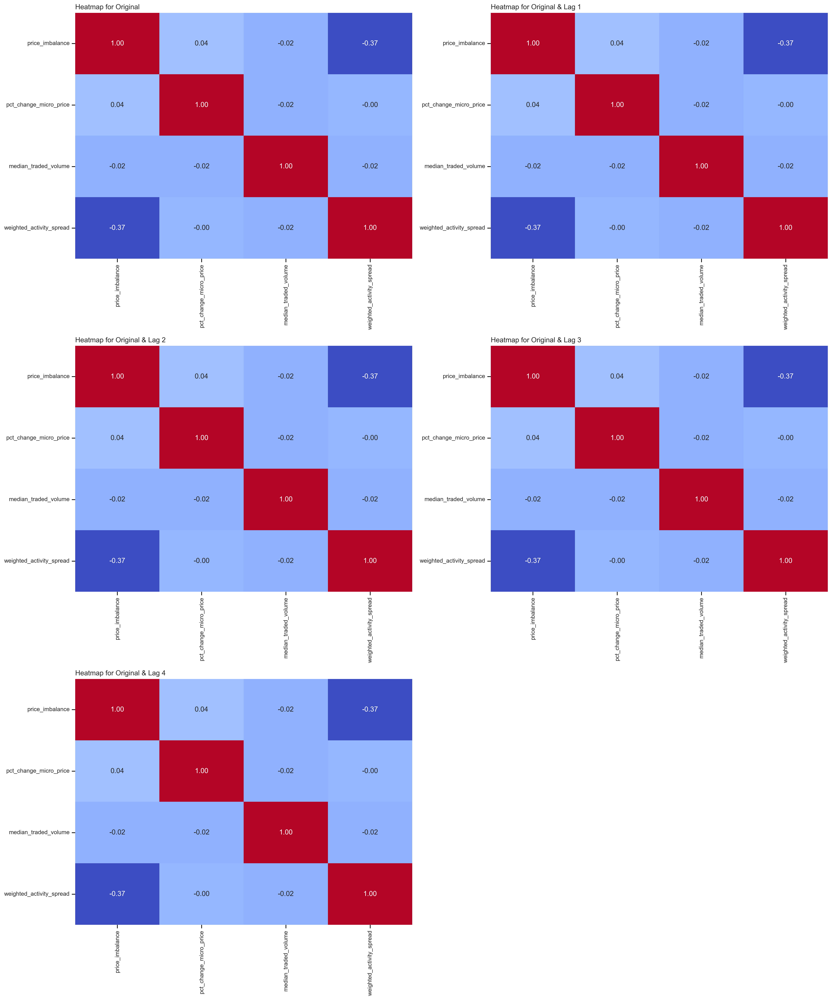

In [170]:

create_lagged_heatmaps(median_df, max_lag=4,tick_fontsize=10, save_fig=True, fig_path='my_lagged_heatmaps.png')